# 1 - Importando os dados

In [90]:
# Bibliotecas
import numpy as np
import pandas as pd
from haversine import haversine
import plotly.express as px
import plotly.graph_objects as go
import folium
from folium.plugins import MarkerCluster

In [59]:
df = pd.read_csv('../dataset/zomato.csv')

In [60]:
# df = pd.read_csv('/content/drive/MyDrive/Data Science/DS/Análise de Dados em Python: Da Lógica a Análise/Ciclo 08 - Projeto do Aluno/Dados/zomato.csv')
# pd.set_option('display.max_columns', None)
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6310675,Mama Lou's Italian Kitchen,162,Las Piñas City,"Block 1, Lot 36, Tropical Avenue Corner Tropic...",BF International,"BF International, Las Piñas City",121.009787,14.447615,Italian,...,Botswana Pula(P),1,0,0,0,3,4.6,3F7E00,Excellent,619
1,6310675,Mama Lou's Italian Kitchen,162,Las Piñas City,"Block 1, Lot 36, Tropical Avenue Corner Tropic...",BF International,"BF International, Las Piñas City",121.009787,14.447615,Italian,...,Botswana Pula(P),1,0,0,0,3,4.6,3F7E00,Excellent,619
2,6314542,Blackbird,162,Makati City,"Nielson Tower, Ayala Triangle Gardens, Salcedo...","Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.024562,14.556042,"European, Asian",...,Botswana Pula(P),0,0,0,0,4,4.7,3F7E00,Excellent,469
3,6301293,Banapple,162,Makati City,"Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.023171,14.556196,"Filipino, American, Italian, Bakery",...,Botswana Pula(P),0,0,0,0,3,4.4,5BA829,Very Good,867
4,6315689,Bad Bird,162,Makati City,"Hole In The Wall, Floor 4, Century City Mall, ...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027708,14.565899,American,...,Botswana Pula(P),0,0,0,0,3,4.4,5BA829,Very Good,858


In [61]:
# Quantidade de linhas e colunas 

df.shape

(7527, 21)

In [62]:
# tipos da colunas
df.dtypes

Restaurant ID             int64
Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking         int64
Has Online delivery       int64
Is delivering now         int64
Switch to order menu      int64
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
dtype: object

# 2 - Limpando os dados

Cópia do Dataset

In [63]:
df1 = df.copy()

## 2.0 - Traduzindo para os dados da Rating text para o inglês

A coluna 'Rating text' nos diz a avaliação dos restaurante dadas pelos clientes, porém como vamos ver a seguir algumas classificações estão em outras linguas. Vamos traduzir todas elas para o inglês: 'Excellent', 'Very Good', 'Good', 'Average', 'Poor' e 'Not rated' .

In [64]:
#dados.loc[:, 'Rating text'].value_counts()
df1.loc[:, 'Rating text'].unique()

array(['Excellent', 'Very Good', 'Good', 'Excelente', 'Muito bom',
       'Average', 'Not rated', 'Poor', 'Vynikajúce', 'Muito Bom',
       'Bardzo dobrze', 'Muy Bueno', 'Bueno', 'Baik', 'Biasa',
       'Skvělá volba', 'Velmi dobré', 'Harika', 'Çok iyi', 'Eccellente',
       'Veľmi dobré', 'Buono', 'Bom', 'Skvělé', 'Wybitnie', 'Sangat Baik',
       'Terbaik', 'İyi'], dtype=object)

In [65]:
df1.loc[df1['Rating text']=='Excelente', 'Rating text'] = 'Excellent'
df1.loc[df1['Rating text']=='Muito bom', 'Rating text'] = 'Very Good'
df1.loc[df1['Rating text']=='Muito Bom', 'Rating text'] = 'Very Good'
df1.loc[df1['Rating text']=='Vynikajúce', 'Rating text'] = 'Excellent'
df1.loc[df1['Rating text']=='Bardzo dobrze', 'Rating text'] = 'Very Good'
df1.loc[df1['Rating text']=='Muy Bueno', 'Rating text'] = 'Very Good'
df1.loc[df1['Rating text']=='Bueno', 'Rating text'] = 'Good'
df1.loc[df1['Rating text']=='Baik', 'Rating text'] = 'Good'
df1.loc[df1['Rating text']=='Biasa', 'Rating text'] = 'Average'
df1.loc[df1['Rating text']=='Skvělá volba', 'Rating text'] = 'Excellent'   # ????
df1.loc[df1['Rating text']=='Velmi dobré', 'Rating text'] = 'Very Good'
df1.loc[df1['Rating text']=='Harika', 'Rating text'] = 'Excellent'   # ????
df1.loc[df1['Rating text']=='Çok iyi', 'Rating text'] = 'Very Good'
df1.loc[df1['Rating text']=='Eccellente', 'Rating text'] = 'Excellent'
df1.loc[df1['Rating text']=='Veľmi dobré', 'Rating text'] = 'Very Good'
df1.loc[df1['Rating text']=='Buono', 'Rating text'] = 'Good'
df1.loc[df1['Rating text']=='Bom', 'Rating text'] = 'Good'
df1.loc[df1['Rating text']=='Skvělé', 'Rating text'] = 'Excellent'   # ????
df1.loc[df1['Rating text']=='Wybitnie', 'Rating text'] = 'Excellent'   
df1.loc[df1['Rating text']=='Sangat Baik', 'Rating text'] = 'Very Good'
df1.loc[df1['Rating text']=='Terbaik', 'Rating text'] = 'Good'
df1.loc[df1['Rating text']=='İyi', 'Rating text'] = 'Good'


In [66]:
df1.loc[:, 'Rating text'].unique()

array(['Excellent', 'Very Good', 'Good', 'Average', 'Not rated', 'Poor'],
      dtype=object)

## 2.1 - Preenchimento do nome dos países

Passando cada código da cóluna 'Country Code' para o seu respectivo pais.

In [67]:
COUNTRIES = {
1: "India",
14: "Australia",
30: "Brazil",
37: "Canada",
94: "Indonesia",
148: "New Zeland",
162: "Philippines",
166: "Qatar",
184: "Singapure",
189: "South Africa",
191: "Sri Lanka",
208: "Turkey",
214: "United Arab Emirates",
215: "England",
216: "United States of America",
}

df1['Country Code'] = df1['Country Code'].apply(lambda x: COUNTRIES[x])

df1.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6310675,Mama Lou's Italian Kitchen,Philippines,Las Piñas City,"Block 1, Lot 36, Tropical Avenue Corner Tropic...",BF International,"BF International, Las Piñas City",121.009787,14.447615,Italian,...,Botswana Pula(P),1,0,0,0,3,4.6,3F7E00,Excellent,619
1,6310675,Mama Lou's Italian Kitchen,Philippines,Las Piñas City,"Block 1, Lot 36, Tropical Avenue Corner Tropic...",BF International,"BF International, Las Piñas City",121.009787,14.447615,Italian,...,Botswana Pula(P),1,0,0,0,3,4.6,3F7E00,Excellent,619
2,6314542,Blackbird,Philippines,Makati City,"Nielson Tower, Ayala Triangle Gardens, Salcedo...","Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.024562,14.556042,"European, Asian",...,Botswana Pula(P),0,0,0,0,4,4.7,3F7E00,Excellent,469
3,6301293,Banapple,Philippines,Makati City,"Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.023171,14.556196,"Filipino, American, Italian, Bakery",...,Botswana Pula(P),0,0,0,0,3,4.4,5BA829,Very Good,867
4,6315689,Bad Bird,Philippines,Makati City,"Hole In The Wall, Floor 4, Century City Mall, ...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027708,14.565899,American,...,Botswana Pula(P),0,0,0,0,3,4.4,5BA829,Very Good,858


## 2.2 - Criação do Tipo de Categoria de Comida

In [68]:
RANGES_FOOD = {
1: "cheap",
2: "normal",
3: "expensive",
4: "gourmet"
}

df1['Price range'] = df1['Price range'].apply(lambda x: RANGES_FOOD[x])

df1.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6310675,Mama Lou's Italian Kitchen,Philippines,Las Piñas City,"Block 1, Lot 36, Tropical Avenue Corner Tropic...",BF International,"BF International, Las Piñas City",121.009787,14.447615,Italian,...,Botswana Pula(P),1,0,0,0,expensive,4.6,3F7E00,Excellent,619
1,6310675,Mama Lou's Italian Kitchen,Philippines,Las Piñas City,"Block 1, Lot 36, Tropical Avenue Corner Tropic...",BF International,"BF International, Las Piñas City",121.009787,14.447615,Italian,...,Botswana Pula(P),1,0,0,0,expensive,4.6,3F7E00,Excellent,619
2,6314542,Blackbird,Philippines,Makati City,"Nielson Tower, Ayala Triangle Gardens, Salcedo...","Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.024562,14.556042,"European, Asian",...,Botswana Pula(P),0,0,0,0,gourmet,4.7,3F7E00,Excellent,469
3,6301293,Banapple,Philippines,Makati City,"Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.023171,14.556196,"Filipino, American, Italian, Bakery",...,Botswana Pula(P),0,0,0,0,expensive,4.4,5BA829,Very Good,867
4,6315689,Bad Bird,Philippines,Makati City,"Hole In The Wall, Floor 4, Century City Mall, ...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027708,14.565899,American,...,Botswana Pula(P),0,0,0,0,expensive,4.4,5BA829,Very Good,858


## 2.3 Criação do nome das Cores

In [69]:
COLORS = {
"3F7E00": "darkgreen",
"5BA829": "green",
"9ACD32": "lightgreen",
"CDD614": "orange",
"FFBA00": "red",
"CBCBC8": "darkred",
"FF7800": "darkred",
}


df1['Rating color'] = df1['Rating color'].apply(lambda x: COLORS[x])


df1.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6310675,Mama Lou's Italian Kitchen,Philippines,Las Piñas City,"Block 1, Lot 36, Tropical Avenue Corner Tropic...",BF International,"BF International, Las Piñas City",121.009787,14.447615,Italian,...,Botswana Pula(P),1,0,0,0,expensive,4.6,darkgreen,Excellent,619
1,6310675,Mama Lou's Italian Kitchen,Philippines,Las Piñas City,"Block 1, Lot 36, Tropical Avenue Corner Tropic...",BF International,"BF International, Las Piñas City",121.009787,14.447615,Italian,...,Botswana Pula(P),1,0,0,0,expensive,4.6,darkgreen,Excellent,619
2,6314542,Blackbird,Philippines,Makati City,"Nielson Tower, Ayala Triangle Gardens, Salcedo...","Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.024562,14.556042,"European, Asian",...,Botswana Pula(P),0,0,0,0,gourmet,4.7,darkgreen,Excellent,469
3,6301293,Banapple,Philippines,Makati City,"Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.023171,14.556196,"Filipino, American, Italian, Bakery",...,Botswana Pula(P),0,0,0,0,expensive,4.4,green,Very Good,867
4,6315689,Bad Bird,Philippines,Makati City,"Hole In The Wall, Floor 4, Century City Mall, ...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027708,14.565899,American,...,Botswana Pula(P),0,0,0,0,expensive,4.4,green,Very Good,858


## 2.4 - Deletando a coluna 'Switch to order menu'

isso pois ela so possui o valor 0, o que não é muito util.

In [70]:
df1.loc[:, 'Switch to order menu'].unique()

array([0], dtype=int64)

In [71]:
df1 = df1.drop('Switch to order menu', axis=1)

df1.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6310675,Mama Lou's Italian Kitchen,Philippines,Las Piñas City,"Block 1, Lot 36, Tropical Avenue Corner Tropic...",BF International,"BF International, Las Piñas City",121.009787,14.447615,Italian,1100,Botswana Pula(P),1,0,0,expensive,4.6,darkgreen,Excellent,619
1,6310675,Mama Lou's Italian Kitchen,Philippines,Las Piñas City,"Block 1, Lot 36, Tropical Avenue Corner Tropic...",BF International,"BF International, Las Piñas City",121.009787,14.447615,Italian,1100,Botswana Pula(P),1,0,0,expensive,4.6,darkgreen,Excellent,619
2,6314542,Blackbird,Philippines,Makati City,"Nielson Tower, Ayala Triangle Gardens, Salcedo...","Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.024562,14.556042,"European, Asian",3100,Botswana Pula(P),0,0,0,gourmet,4.7,darkgreen,Excellent,469
3,6301293,Banapple,Philippines,Makati City,"Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.023171,14.556196,"Filipino, American, Italian, Bakery",800,Botswana Pula(P),0,0,0,expensive,4.4,green,Very Good,867
4,6315689,Bad Bird,Philippines,Makati City,"Hole In The Wall, Floor 4, Century City Mall, ...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027708,14.565899,American,700,Botswana Pula(P),0,0,0,expensive,4.4,green,Very Good,858


## 2.5 - Deletando valores nulos 

In [72]:
# Primeiro vendo quantos valore nulos existem
nulos = 0
for i in range(df1.shape[0]):
  a = df1.loc[:, "Cuisines"].isnull()[i]
  if a == True:
    nulos += 1
print('Total de valores nulos: ', nulos)

Total de valores nulos:  15


In [73]:
# Excluindo os valores nulos e resetando o index
df1 = df1.dropna()
df1 = df1.reset_index()

## 2.6 - Coluna 'Cuisines'

In [74]:
df1["Cuisines"] = df1.loc[:, "Cuisines"].apply(lambda x: x.split(",")[0])

In [75]:
df1.head()

,index,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,...,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Price range,Aggregate rating,Rating color,Rating text,Votes
0,0,6310675,Mama Lou's Italian Kitchen,Philippines,Las Piñas City,"Block 1, Lot 36, Tropical Avenue Corner Tropic...",BF International,"BF International, Las Piñas City",121.009787,14.447615,...,1100,Botswana Pula(P),1,0,0,expensive,4.6,darkgreen,Excellent,619
1,1,6310675,Mama Lou's Italian Kitchen,Philippines,Las Piñas City,"Block 1, Lot 36, Tropical Avenue Corner Tropic...",BF International,"BF International, Las Piñas City",121.009787,14.447615,...,1100,Botswana Pula(P),1,0,0,expensive,4.6,darkgreen,Excellent,619
2,2,6314542,Blackbird,Philippines,Makati City,"Nielson Tower, Ayala Triangle Gardens, Salcedo...","Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.024562,14.556042,...,3100,Botswana Pula(P),0,0,0,gourmet,4.7,darkgreen,Excellent,469
3,3,6301293,Banapple,Philippines,Makati City,"Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.023171,14.556196,...,800,Botswana Pula(P),0,0,0,expensive,4.4,green,Very Good,867
4,4,6315689,Bad Bird,Philippines,Makati City,"Hole In The Wall, Floor 4, Century City Mall, ...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027708,14.565899,...,700,Botswana Pula(P),0,0,0,expensive,4.4,green,Very Good,858


## 2.7 - Renomear as colunas do DataFrame

In [76]:
df1.columns

Index(['index', 'Restaurant ID', 'Restaurant Name', 'Country Code', 'City',
       'Address', 'Locality', 'Locality Verbose', 'Longitude', 'Latitude',
       'Cuisines', 'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Price range',
       'Aggregate rating', 'Rating color', 'Rating text', 'Votes'],
      dtype='object')

In [77]:
df1.rename(columns={
'Restaurant ID': 'Restaurant_ID', 
'Restaurant Name': 'Restaurant_name',
'Country Code': 'Country',
'Locality Verbose': 'Locality_verbose',
'Average Cost for two': 'Average_cost_for_two', 
'Has Table booking': 'Has_table_booking',
'Has Online delivery': 'Has_online_delivery', 
'Is delivering now': 'Is_delivering_now', 
'Price range': 'Price_range',
'Aggregate rating': 'Aggregate_rating', 
'Rating color': 'Rating_color', 
'Rating text': 'Rating_text'
}, inplace=True)

df1.head()

,index,Restaurant_ID,Restaurant_name,Country,City,Address,Locality,Locality_verbose,Longitude,Latitude,...,Average_cost_for_two,Currency,Has_table_booking,Has_online_delivery,Is_delivering_now,Price_range,Aggregate_rating,Rating_color,Rating_text,Votes
0,0,6310675,Mama Lou's Italian Kitchen,Philippines,Las Piñas City,"Block 1, Lot 36, Tropical Avenue Corner Tropic...",BF International,"BF International, Las Piñas City",121.009787,14.447615,...,1100,Botswana Pula(P),1,0,0,expensive,4.6,darkgreen,Excellent,619
1,1,6310675,Mama Lou's Italian Kitchen,Philippines,Las Piñas City,"Block 1, Lot 36, Tropical Avenue Corner Tropic...",BF International,"BF International, Las Piñas City",121.009787,14.447615,...,1100,Botswana Pula(P),1,0,0,expensive,4.6,darkgreen,Excellent,619
2,2,6314542,Blackbird,Philippines,Makati City,"Nielson Tower, Ayala Triangle Gardens, Salcedo...","Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.024562,14.556042,...,3100,Botswana Pula(P),0,0,0,gourmet,4.7,darkgreen,Excellent,469
3,3,6301293,Banapple,Philippines,Makati City,"Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.023171,14.556196,...,800,Botswana Pula(P),0,0,0,expensive,4.4,green,Very Good,867
4,4,6315689,Bad Bird,Philippines,Makati City,"Hole In The Wall, Floor 4, Century City Mall, ...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027708,14.565899,...,700,Botswana Pula(P),0,0,0,expensive,4.4,green,Very Good,858


## 2.8 - Criando uma coluna com todos os valores da coluna 'Average_cost_for_two' em Dolar

In [78]:
df1.loc[:, 'Currency'].unique()

array(['Botswana Pula(P)', 'Brazilian Real(R$)', 'Dollar($)',
       'Emirati Diram(AED)', 'Indian Rupees(Rs.)',
       'Indonesian Rupiah(IDR)', 'NewZealand($)', 'Pounds(£)',
       'Qatari Rial(QR)', 'Rand(R)', 'Sri Lankan Rupee(LKR)',
       'Turkish Lira(TL)'], dtype=object)

In [79]:
moeda = { 'Botswana Pula(P)': 0.075,
'Brazilian Real(R$)':     0.19,
'Emirati Diram(AED)':     0.27, 
'Indian Rupees(Rs.)':     0.012,
'Indonesian Rupiah(IDR)': 0.000065, 
'NewZealand($)':          0.617486, 
'Pounds(£)':              1.1947,
'Qatari Rial(QR)':        0.27, 
'Rand(R)':                0.054, 
'Sri Lankan Rupee(LKR)':   0.0031,
'Turkish Lira(TL)':        0.053}

df1['Average_cost_for_two_Dollar'] = df1.loc[:, 'Average_cost_for_two']
for i in moeda:
  print(moeda[i])
  df1.loc[df1.loc[:, 'Currency']==i, 'Average_cost_for_two_Dollar'] = df1.loc[df1.loc[:, 'Currency']==i, 'Average_cost_for_two']*moeda[i]


df1.head()

0.075
0.19
0.27
0.012
6.5e-05
0.617486
1.1947
0.27
0.054
0.0031
0.053


,index,Restaurant_ID,Restaurant_name,Country,City,Address,Locality,Locality_verbose,Longitude,Latitude,...,Currency,Has_table_booking,Has_online_delivery,Is_delivering_now,Price_range,Aggregate_rating,Rating_color,Rating_text,Votes,Average_cost_for_two_Dollar
0,0,6310675,Mama Lou's Italian Kitchen,Philippines,Las Piñas City,"Block 1, Lot 36, Tropical Avenue Corner Tropic...",BF International,"BF International, Las Piñas City",121.009787,14.447615,...,Botswana Pula(P),1,0,0,expensive,4.6,darkgreen,Excellent,619,82.5
1,1,6310675,Mama Lou's Italian Kitchen,Philippines,Las Piñas City,"Block 1, Lot 36, Tropical Avenue Corner Tropic...",BF International,"BF International, Las Piñas City",121.009787,14.447615,...,Botswana Pula(P),1,0,0,expensive,4.6,darkgreen,Excellent,619,82.5
2,2,6314542,Blackbird,Philippines,Makati City,"Nielson Tower, Ayala Triangle Gardens, Salcedo...","Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.024562,14.556042,...,Botswana Pula(P),0,0,0,gourmet,4.7,darkgreen,Excellent,469,232.5
3,3,6301293,Banapple,Philippines,Makati City,"Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.023171,14.556196,...,Botswana Pula(P),0,0,0,expensive,4.4,green,Very Good,867,60.0
4,4,6315689,Bad Bird,Philippines,Makati City,"Hole In The Wall, Floor 4, Century City Mall, ...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027708,14.565899,...,Botswana Pula(P),0,0,0,expensive,4.4,green,Very Good,858,52.5


### 2.9 - Removendo um outlier

In [80]:
df1.drop(385,axis=0,inplace=True)

In [81]:
print('A base de dados agora tem {} linhas e {} colunas.'.format(df1.shape[0], df1.shape[1]))

A base de dados agora tem 7511 linhas e 22 colunas.


# Geral


## 1. Quantos restaurantes únicos estão registrados?


In [82]:
len(df1.loc[:, 'Restaurant_ID'].unique())

6928

## 2. Quantos países únicos estão registrados?


In [83]:
len(df1.loc[:, 'Country'].unique()) 

15

## 3. Quantas cidades únicas estão registradas?


In [84]:
len(df1.loc[:, 'City'].unique())

125

## 4. Qual o total de avaliações feitas?


In [85]:
df1.loc[:, 'Votes'].sum()

4638332

## 5. Qual o total de tipos de culinária registrados?

In [86]:
len(df1.loc[:, 'Cuisines'].unique())

165

## 6. A localização de cada restaurante.

In [92]:
df1_plot = df1.copy()

map = folium.Map( zoom_start=11 )

mc = MarkerCluster().add_to( map )


for index, location_info in df1_plot.iterrows():
    # Cores nos marcadores
    icon=folium.Icon(color=df1_plot.loc[index, 'Rating_color'], icon='glyphicon-cutlery', prefix='glyphicon')

    # Informação sobre cada restaurante
    html = ('<strong>' + df1_plot.loc[index, 'Restaurant_name'] + '</strong>' + '<br>' + 
          'Cuisine: ' + df1_plot.loc[index, 'Cuisines'] + '<br>' +
          'Price for two: ' + str(df1_plot.loc[index, 'Average_cost_for_two']) + ' ' + df1_plot.loc[index, 'Currency'] 
          )
    iframe = folium.IFrame(html, width=270, height=120)
    popup = folium.Popup(iframe, max_width=300)


    folium.Marker( location = [np.mean(df1_plot.loc[index, 'Latitude']), np.mean(df1_plot.loc[index, 'Longitude'])], 
                icon=icon, 
                popup= popup).add_to( mc ) 



folium.LayerControl().add_to(mc)

map

# Pais

## 1. Qual o nome do país que possui mais cidades registradas?

In [146]:
df_aux = df1.loc[:, ['Country', 'City']].groupby(['Country']).nunique()
df_aux = df_aux.sort_values('City', ascending=True).iloc[:, :].reset_index()

df_aux['city_porc'] = (df_aux.loc[:, 'City']/df_aux.loc[:, 'City'].sum())*100

df_aux.iloc[-1, :][0]

'India'

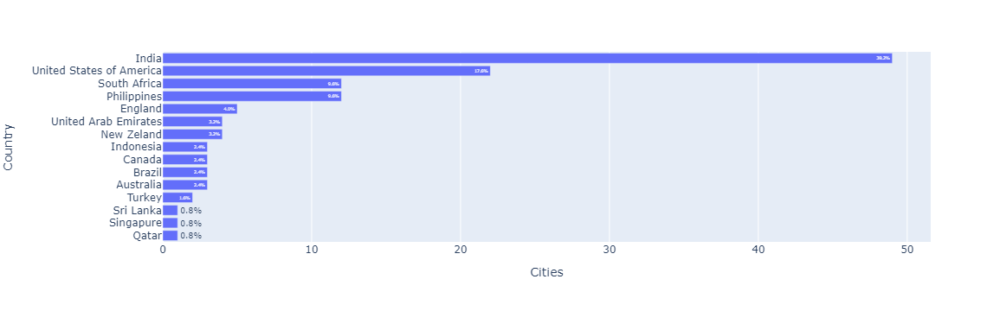

In [145]:
# gráfico
fig = px.bar(df_aux, y='Country', x='City', orientation='h',
                 labels={'City': 'Cities'},
                 text=df_aux['city_porc'].apply(lambda x: '{0:.1f}%'.format(x)))  # cod para mostrar a porcentagem
fig.show()

## 2. Qual o nome do país que possui mais restaurantes registrados?

In [147]:
df_aux = df1.loc[:, ['Country', 'Restaurant_ID']].groupby('Country').nunique().reset_index()

df_aux = df_aux.sort_values('Restaurant_ID', ascending=True).iloc[:, :]

df_aux.iloc[-1, :][0]

'India'

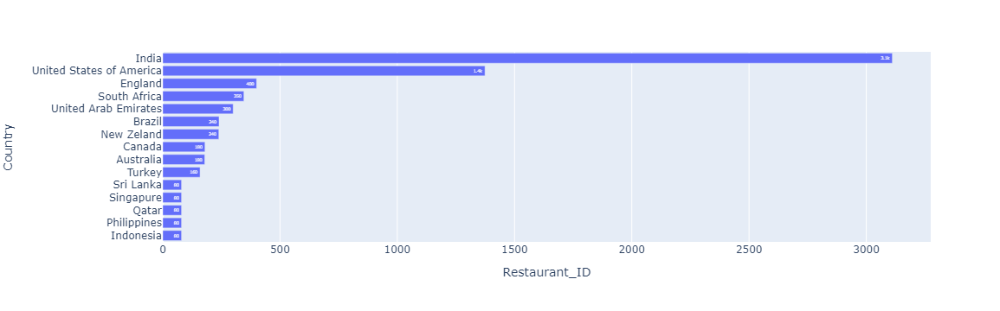

In [148]:
# gráfico
fig = px.bar(df_aux, y='Country', x='Restaurant_ID', orientation='h', text_auto='.2s')
fig.show()

## 3. Qual o nome do país que possui mais restaurantes com o nível de preço igual a gourmet registrados?

In [131]:
df_aux = df1.loc[df1.loc[:, 'Price_range']=='gourmet', ['Country', 'Restaurant_ID']].groupby('Country').nunique()

df_aux = df_aux.sort_values('Restaurant_ID', ascending=False).iloc[:, :]

df_aux.reset_index()

,Country,Restaurant_ID
0,United States of America,415
1,South Africa,221
2,India,195
3,Brazil,148
4,United Arab Emirates,102
5,England,79
6,New Zeland,79
7,Turkey,59
8,Singapure,58
9,Canada,54


## 4. Qual o nome do país que possui a maior quantidade de tipos de culinária distintos?


In [149]:
df_aux = df1.loc[:, ['Country', 'Cuisines']].groupby('Country').nunique().reset_index()
df_aux = df_aux.sort_values('Cuisines', ascending=False).iloc[:, :]

df_aux.iloc[0, :][0]

'India'

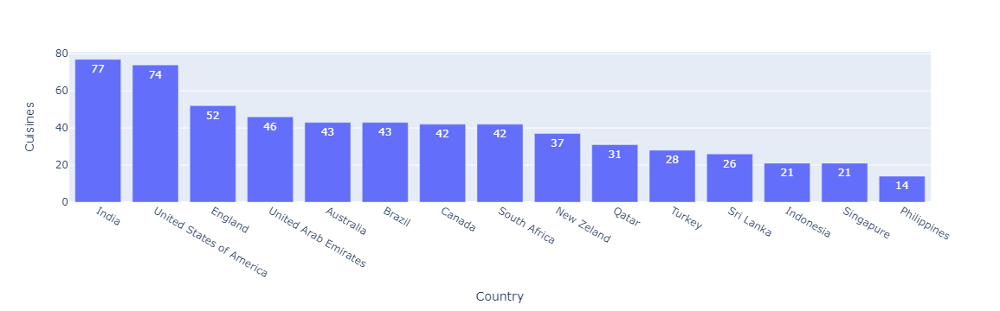

In [150]:
# gráfico
fig = px.bar(df_aux, x='Country', y='Cuisines', text_auto='.2s')
fig.show()

## 5. Qual o nome do país que possui a maior quantidade de avaliações feitas?

In [128]:
df_aux = df1.loc[:, ['Country', 'Votes']].groupby('Country').sum()
df_aux.sort_values('Votes', ascending=False).iloc[:, :].reset_index()

,Country,Votes
0,India,3175051
1,United States of America,531075
2,United Arab Emirates,205175
3,Australia,130154
4,Turkey,106112
5,Canada,105018
6,Indonesia,91456
7,South Africa,90161
8,New Zeland,55401
9,Philippines,52825


## 6. Qual o nome do país que possui a maior quantidade de restaurantes que fazem entrega?

In [127]:
df_aux = df1.loc[df1.loc[:, 'Has_online_delivery']==1, ['Country', 'Has_online_delivery']].groupby('Country').count()

df_aux.sort_values('Has_online_delivery', ascending=False).iloc[:, :].reset_index()

,Country,Has_online_delivery
0,India,2365
1,United Arab Emirates,236
2,Qatar,43
3,Philippines,9


## 7. Qual o nome do país que possui a maior quantidade de restaurantes que aceitam reservas?

In [126]:
df_aux = df1.loc[df1.loc[:, 'Has_table_booking']==1, ['Country', 'Has_table_booking']].groupby('Country').count()

df_aux.sort_values('Has_table_booking', ascending=False).iloc[:, :].reset_index()

,Country,Has_table_booking
0,India,291
1,England,58
2,Australia,28
3,Philippines,28
4,New Zeland,19
5,Indonesia,14
6,United Arab Emirates,12
7,Qatar,5
8,Turkey,5
9,South Africa,3


## 8. Qual o nome do país que possui, na média, a maior quantidade de avaliações registrada?

In [151]:
df_aux = df1.loc[:, ['Country', 'Votes']].groupby('Country').mean().reset_index()

df_aux = df_aux.sort_values(by=['Votes'], ascending=False).iloc[:, :]

df_aux.iloc[0, :][0]

'Indonesia'

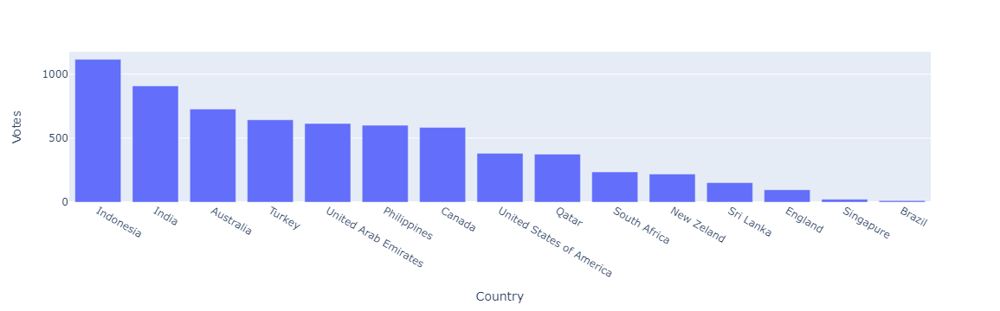

In [152]:
# gráfico
fig = px.bar(df_aux, x='Country', y='Votes')
fig.show()

## 9. Qual o nome do país que possui, na média, a maior nota média registrada?

In [114]:
df_aux = df1.loc[:, ['Country', 'Aggregate_rating']].groupby('Country').mean().reset_index()

df_aux = df_aux.sort_values(by=['Aggregate_rating'], ascending=False).iloc[0, :]
df_aux


Country             Indonesia
Aggregate_rating          4.6
Name: 5, dtype: object

## 10. Qual o nome do país que possui, na média, a menor nota média registrada?

In [113]:
df_aux = df1.loc[:, ['Country', 'Aggregate_rating']].groupby('Country').mean().reset_index()

df_aux.sort_values(by=['Aggregate_rating'], ascending=True).iloc[0, :]

Country               Brazil
Aggregate_rating    3.349425
Name: 1, dtype: object

## 11. Qual a média de preço de um prato para dois por país?

In [135]:
df_aux = df1.loc[:, ['Country', 'Average_cost_for_two_Dollar']].groupby('Country').mean()
df_aux = df_aux.sort_values(by=['Average_cost_for_two_Dollar'], ascending=False).reset_index()

df_aux.iloc[0, :]

Country                         Singapure
Average_cost_for_two_Dollar    141.036585
Name: 0, dtype: object

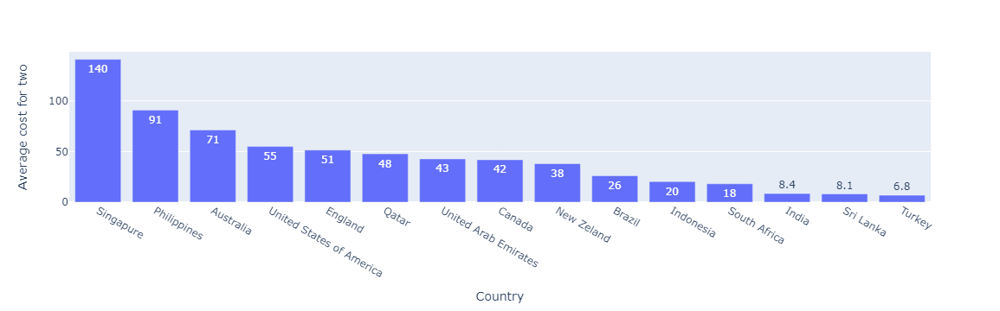

In [132]:
# grafico
df_aux = df1.loc[:, ['Country', 'Average_cost_for_two_Dollar']].groupby('Country').mean().reset_index()
df_aux = df_aux.sort_values(by=['Average_cost_for_two_Dollar'], ascending=False)
fig = px.bar(df_aux, x='Country', y='Average_cost_for_two_Dollar', labels={'Average_cost_for_two_Dollar': 'Average cost for two'}, text_auto='.2s')
fig.show()

# Cidade

## 1. Qual o nome da cidade que possui mais restaurantes registrados?

In [153]:
df_aux = df1.loc[:, ['Country', 'City', 'Restaurant_ID']].groupby(['Country', 'City']).nunique().reset_index()

df_aux.sort_values(by=['Restaurant_ID'], ascending=False).iloc[:, :]

,Country,City,Restaurant_ID
44,India,Nagpur,80
33,India,Indore,80
35,India,Kanpur,80
36,India,Kochi,80
37,India,Kolkata,80
...,...,...,...
70,Philippines,Las Piñas City,1
90,South Africa,Johannesburg South,1
74,Philippines,Marikina City,1
75,Philippines,Muntinlupa City,1


## 2. Qual o nome da cidade que possui mais restaurantes com nota média acima de
4?


In [156]:
df_aux = df1.loc[df1.loc[:, 'Aggregate_rating']>4.0, ['City', 'Restaurant_ID']].groupby('City').nunique().reset_index()

df_aux = df_aux.sort_values('Restaurant_ID', ascending=False)
df_aux = df_aux.iloc[0:10,:]

country = []
for i in df_aux.index:
  city = df_aux.loc[i, 'City']
  country.append(df1.loc[df1.loc[:, 'City']==city, 'Country'].iloc[0])

df_aux['country'] = country


df_aux


,City,Restaurant_ID,country
11,Bangalore,79,India
56,London,78,England
43,Houston,75,United States of America
48,Jakarta,74,Indonesia
23,Chennai,72,India
8,Auckland,72,New Zeland
53,Kolkata,70,India
120,İstanbul,69,Turkey
91,Pune,69,India
70,Mumbai,69,India


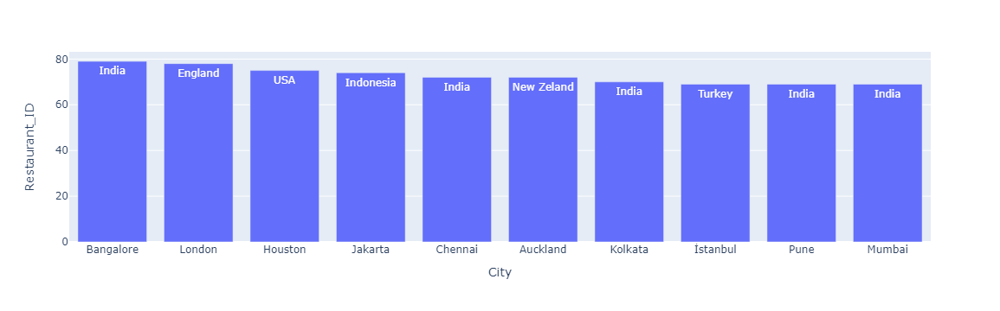

In [157]:
# gráfico
fig = px.bar(df_aux, x='City', y='Restaurant_ID', 
             hover_data=['country'],
             text = df_aux['country'].apply(lambda x: x if x!='United States of America' else 'USA' ))
fig.show()

## 3. Qual o nome da cidade que possui mais restaurantes com nota média abaixo de 2.5?


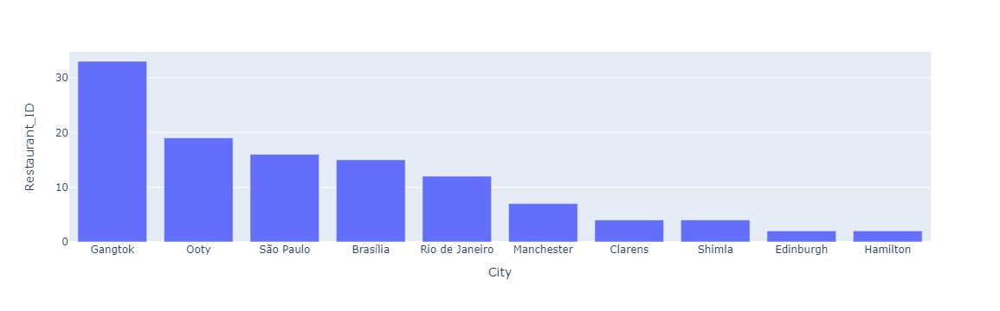

In [158]:
df_aux = df1.loc[df1.loc[:, 'Aggregate_rating']<2.5, ['City', 'Restaurant_ID']].groupby('City').nunique().reset_index()

df_aux = df_aux.sort_values('Restaurant_ID', ascending=False).iloc[0:10, :]


# gráfico
fig = px.bar(df_aux, x='City', y='Restaurant_ID')
fig.show()


## 4. Qual o nome da cidade que possui o maior valor médio de um prato para dois?

In [159]:
df_aux = df1.loc[:, ['City', 'Average_cost_for_two']].groupby(['City']).mean().reset_index()

df_aux.sort_values(by=['Average_cost_for_two'], ascending=False).iloc[:, :]

,City,Average_cost_for_two
51,Jakarta,319615.384615
115,Tangerang,180000.000000
15,Bogor,175000.000000
86,Pasay City,4000.000000
27,Colombo,2607.471264
...,...,...
19,Calgary,32.500000
60,Los Angeles,30.000000
30,Denver,29.916667
91,Phoenix,28.000000


## 5. Qual o nome da cidade que possui a maior quantidade de tipos de culinária distintas?


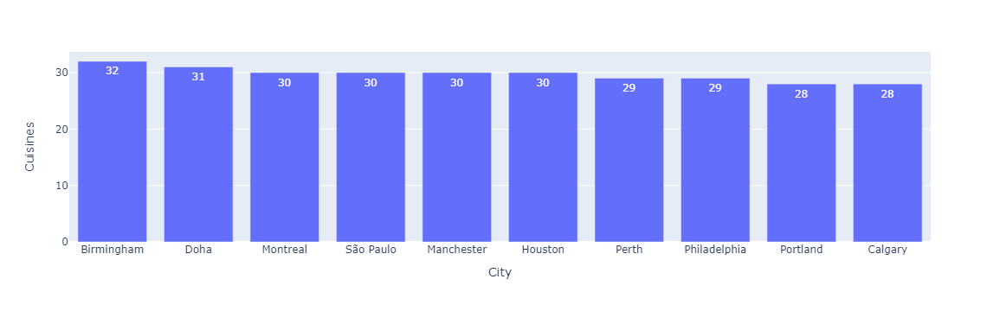

In [162]:
df_aux = df1.loc[:, ['City', 'Cuisines']].groupby(['City']).nunique().reset_index()
df_aux = df_aux.sort_values('Cuisines', ascending=False).iloc[0:10, :]

# gráfico
fig = px.bar(df_aux, x='City', y='Cuisines', text_auto='.2s')
fig.show()

## 6. Qual o nome da cidade que possui a maior quantidade de restaurantes que fazem reservas?


In [163]:
df_aux = df1.loc[df1.loc[:, 'Has_table_booking']==1, ['City', 'Has_table_booking']].groupby('City').count().reset_index()

df_aux.sort_values('Has_table_booking', ascending=False).iloc[:, :]

,City,Has_table_booking
8,Bangalore,47
16,Chennai,35
55,Pune,31
44,Mumbai,23
48,New Delhi,17
...,...,...
11,Bogor,1
12,Boston,1
33,Johannesburg,1
47,Nashik,1


## 7. Qual o nome da cidade que possui a maior quantidade de restaurantes que fazem entregas?

In [164]:
df_aux = df1.loc[df1.loc[:, 'Is_delivering_now']==1, ['City', 'Is_delivering_now']].groupby('City').count().reset_index()

df_aux.sort_values('Is_delivering_now', ascending=False).iloc[0:10, :]

,City,Is_delivering_now
5,Aurangabad,53
48,Vadodara,52
26,Ludhiana,50
7,Bhopal,50
21,Jaipur,49
12,Dehradun,48
4,Amritsar,48
2,Ahmedabad,47
49,Varanasi,43
42,Ranchi,43


## 8. Qual o nome da cidade que possui a maior quantidade de restaurantes que aceitam pedidos online?

In [165]:
df_aux = df1.loc[df1.loc[:, 'Has_online_delivery']==1, ['City', 'Has_online_delivery']].groupby('City').count().reset_index()

df_aux.sort_values('Has_online_delivery', ascending=False).iloc[0:10, :]

,City,Has_online_delivery
0,Abu Dhabi,86
7,Bhopal,81
45,Sharjah,80
33,Nagpur,80
49,Vadodara,79
5,Aurangabad,76
40,Patna,74
3,Allahabad,74
46,Surat,73
25,Kolkata,73


# Restaurantes

## 1. Qual o nome do restaurante que possui a maior quantidade de avaliações?

In [166]:
df_aux = df1.loc[:, ['Restaurant_name', 'Votes']].groupby('Restaurant_name').sum().reset_index()

df_aux.sort_values('Votes', ascending=False).iloc[:, :]

,Restaurant_name,Votes
1524,Domino's Pizza,119498
72,AB's - Absolute Barbecues,117750
1181,Chili's Grill & Bar,55378
458,Barbeque Nation,53200
496,Bawarchi,41711
...,...,...
1722,Famiglia Rivitti,0
5594,Veeno,0
338,Avenida Paulista,0
1047,Capricho Mineiro,0


## 2. Qual o nome do restaurante com a maior nota média?

In [167]:
df_aux = df1.sort_values('Aggregate_rating', ascending=False).head(255)
df_aux = df_aux.loc[:, ['Cuisines', 'Restaurant_name', 'Country', 'City', 'Average_cost_for_two', 'Currency', 'Aggregate_rating', 'Votes']]

df_aux.sort_values(['Cuisines', 'City', 'Cuisines'], ascending=True)

,Cuisines,Restaurant_name,Country,City,Average_cost_for_two,Currency,Aggregate_rating,Votes
422,American,Brick Store Pub,United States of America,Atlanta,10,Dollar($),4.9,836
599,American,Fat Cat,United States of America,Boston,75,Dollar($),4.9,156
726,American,OEB Breakfast Co.,Canada,Calgary,25,Dollar($),4.9,1477
822,American,Portillo's Hot Dogs,United States of America,Chicago,30,Dollar($),4.9,1025
987,American,Park Burger,United States of America,Denver,35,Dollar($),4.9,256
...,...,...,...,...,...,...,...,...
2016,Tapas,The Harvest Vine,United States of America,Seattle,75,Dollar($),4.9,820
3210,Tex-Mex,Chili's Grill & Bar,India,Bhubaneshwar,700,Indian Rupees(Rs.),4.9,301
3211,Tex-Mex,Chili's Grill & Bar,India,Bhubaneshwar,700,Indian Rupees(Rs.),4.9,301
6525,Vietnamese,Vietnam House Restaurant & Gallery,England,Edinburgh,30,Pounds(£),4.9,64


In [168]:
df_aux = df1.loc[:, ['Restaurant_name', 'Aggregate_rating']].groupby('Restaurant_name').mean().reset_index()
df_aux = df_aux.sort_values('Aggregate_rating', ascending=False).iloc[0:10, :]
df_aux
# df_aux1 = df1.iloc[[df_aux.loc[:, 'Restaurant_name'].index[x] for x in range(10)], :]

# df_aux1.loc[:, ['Restaurant_name', 'Country', 'City', 'Cuisines', 'Average_cost_for_two', 'Currency', 'Aggregate_rating', 'Votes']]

,Restaurant_name,Aggregate_rating
2778,Kukis,4.9
2756,Kono's Surf Club Cafe,4.9
4388,Screen Door,4.9
922,Cafe Del Sol Classico,4.9
1955,Gelateria Montecatini Terme,4.9
1956,Gemelli Cucina Bar,4.9
5136,The Halal Guys,4.9
1231,Churrascaria Palace,4.9
1414,Dalessandro's Steaks,4.9
3142,Mandoo Korean Dumplings,4.9


## 3. Qual o nome do restaurante que possui o maior valor de uma prato para duas pessoas?


In [169]:
df1.loc[:, ['Restaurant_name', 'Average_cost_for_two']].sort_values('Average_cost_for_two', ascending=False)

,Restaurant_name,Average_cost_for_two
6034,The Café - Hotel Mulia,1200000
6035,The Café - Hotel Mulia,1200000
6071,GIA Restaurant & Bar,700000
6041,Shabu-Shabu Shaburi,600000
6029,SKYE,600000
...,...,...
1135,Tiny Boxwood's,0
6288,Mr Go's,0
6289,Mr Go's,0
1136,Tiny Boxwood's,0


## 4. Qual o nome do restaurante de tipo de culinária brasileira que possui a menor média de avaliação?

In [170]:
df2 = df1.loc[df1.loc[:, 'Cuisines'] == 'Brazilian', ['Restaurant_name', 'Cuisines', 'Country', 'Aggregate_rating']].sort_values('Aggregate_rating')


df2.groupby('Restaurant_name').mean('Aggregate_rating').sort_values('Aggregate_rating')

,Aggregate_rating
Restaurant_name,
Restaurante dos Amigos,0.0
Loca Como tu Madre,0.0
Cantinho da Gula,0.0
Capricho Mineiro,0.0
Tempero das Gerais,0.0
...,...
Texas De Brazil,4.8
Fogo de Chão,4.8
Braseiro da Gávea,4.9


## 5. Qual o nome do restaurante de tipo de culinária brasileira, e que é do Brasil, que possui a maior média de avaliação?

In [171]:
df2 = df1.loc[(df1.loc[:, 'Cuisines'] == 'Brazilian') & (df1.loc[:, 'Country'] == 'Brazil'), ['Restaurant_name', 'Cuisines', 'Country', 'Aggregate_rating']].sort_values('Aggregate_rating', ascending=False)

df2.groupby('Restaurant_name').mean('Aggregate_rating').sort_values('Aggregate_rating', ascending=False)

,Aggregate_rating
Restaurant_name,
Braseiro da Gávea,4.90
Aprazível,4.90
Fogo de Chão,4.80
Mocotó,4.80
Aconchego Carioca,4.70
Zazá Bistrô Tropical,4.70
Veloso,4.60
Garota de Ipanema,4.55
Esquina Mocotó,4.50


## 6. Os restaurantes que aceitam pedido online são também, na média, os restaurantes que mais possuem avaliações registradas?


In [173]:
df_aux = df1.loc[df1.loc[:, 'Has_online_delivery']==1, ['City', 'Restaurant_ID', 'Has_online_delivery', 'Votes']].groupby('Restaurant_ID').mean().reset_index()

df_aux.sort_values('Votes', ascending=False).iloc[:, :]

,Restaurant_ID,Has_online_delivery,Votes
140,90896,1.0,41333.0
100,58882,1.0,17394.0
332,308322,1.0,13627.0
142,91662,1.0,11910.0
1668,18207447,1.0,11836.0
...,...,...,...
2203,18699780,1.0,1.0
2415,18973097,1.0,1.0
2199,18699439,1.0,1.0
2414,18972725,1.0,0.0


In [174]:
df_aux = df1.loc[df1.loc[:, 'Has_online_delivery']==0, ['City', 'Restaurant_ID', 'Has_online_delivery', 'Votes']].groupby('Restaurant_ID').mean().reset_index()

df_aux.sort_values('Votes', ascending=False).iloc[:, :]

,Restaurant_ID,Has_online_delivery,Votes
22,51705,0.0,15270.0
21,51040,0.0,14984.0
25,56618,0.0,12443.0
23,54162,0.0,10892.0
31,70856,0.0,9774.0
...,...,...,...
4401,18756343,0.0,0.0
4402,18756659,0.0,0.0
1074,6600542,0.0,0.0
4383,18746451,0.0,0.0


## 7. Os restaurantes que fazem reservas são também, na média, os restaurantes que possuem o maior valor médio de um prato para duas pessoas?

In [175]:
df_aux = df1.loc[df1.loc[:, 'Has_table_booking']==1, ['City', 'Restaurant_ID', 'Has_table_booking', 'Average_cost_for_two']].groupby('Restaurant_ID').mean().reset_index()

df_aux.sort_values('Average_cost_for_two', ascending=False).iloc[:, :]

,Restaurant_ID,Has_table_booking,Average_cost_for_two
156,7421967,1.0,450000.0
352,18671845,1.0,400000.0
290,18538909,1.0,350000.0
395,18800878,1.0,300000.0
325,18615392,1.0,300000.0
...,...,...,...
166,7601106,1.0,20.0
181,7900293,1.0,20.0
142,6900288,1.0,20.0
146,6901025,1.0,10.0


In [176]:
df_aux = df1.loc[df1.loc[:, 'Has_table_booking']==0, ['City', 'Restaurant_ID', 'Has_table_booking', 'Average_cost_for_two']].groupby('Restaurant_ID').mean().reset_index()

df_aux.sort_values('Average_cost_for_two', ascending=False).iloc[:, :]

,Restaurant_ID,Has_table_booking,Average_cost_for_two
3050,7403667,0.0,1200000.0
3061,7423164,0.0,700000.0
3062,7425027,0.0,600000.0
3048,7402935,0.0,600000.0
5461,18407143,0.0,550000.0
...,...,...,...
2837,6901412,0.0,0.0
5313,18283468,0.0,0.0
4283,16890106,0.0,0.0
4271,16886524,0.0,0.0


## 8. Os restaurantes do tipo de culinária japonesa dos Estados Unidos da América possuem um valor médio de prato para duas pessoas maior que as churrascarias americanas (BBQ)?

In [177]:
df2 = df1.loc[(df1.loc[:, 'Cuisines'] == 'Japanese') & (df1.loc[:, 'Country'] == 'United States of America'), ['Restaurant_name', 'Cuisines', 'Country', 'Average_cost_for_two']].sort_values('Average_cost_for_two', ascending=False)

df2.groupby('Restaurant_name').mean().sort_values('Average_cost_for_two', ascending=False)


,Average_cost_for_two
Restaurant_name,
Nobu,250.0
Morimoto,120.0
Roka Akor - Chicago,100.0
Uchi,80.0
Bamboo Sushi,75.0
Shibui Japanese Restaurant,75.0
Sushi Den,70.0
Raku,70.0
Pod,70.0


In [178]:
df2 = df1.loc[df1.loc[:, 'Cuisines'] == 'BBQ',:]

df2.groupby('Restaurant_name').mean().sort_values('Average_cost_for_two', ascending=False)


,index,Restaurant_ID,Longitude,Latitude,Average_cost_for_two,Has_table_booking,Has_online_delivery,Is_delivering_now,Aggregate_rating,Votes,Average_cost_for_two_Dollar
Restaurant_name,,,,,,,,,,,
Magal Mapogalmegi BBQ,6072.333333,1.854353e+07,106.823692,-6.192889,300000.0,0.333333,0.0,0.0,4.70,743.333333,19.5
The Indi Grill,3875.000000,1.887112e+07,78.363245,17.448270,1500.0,1.000000,0.0,0.0,4.50,251.000000,18.0
The Big Barbeque,2971.000000,1.889707e+07,77.650696,12.839154,1500.0,1.000000,0.0,0.0,4.70,992.000000,18.0
AB's - Absolute Barbecues,3353.500000,1.244543e+07,80.210302,12.975161,1400.0,1.000000,0.0,0.0,4.90,4687.333333,16.8
Universal Barbeque,5421.000000,1.878425e+07,73.734492,18.597459,1200.0,1.000000,0.0,0.0,4.50,1686.000000,14.4
Fresh Off The Boat,5415.000000,1.859815e+07,73.827131,18.506621,900.0,0.000000,1.0,0.0,4.50,531.000000,10.8
Dindigul Thalappakatti,3383.500000,6.514450e+04,80.224995,12.951496,800.0,0.000000,1.0,1.0,3.90,1202.500000,9.6
Big Feast,3510.000000,3.500792e+06,78.067448,30.359534,500.0,0.000000,1.0,0.0,4.20,417.000000,6.0
A Figueira Rubaiyat,296.000000,6.702159e+06,-46.669833,-23.565500,300.0,0.000000,0.0,0.0,4.70,45.000000,57.0


# Tipos de Culinária

## 1. Dos restaurantes que possuem o tipo de culinária italiana, qual o nome do restaurante com a maior média de avaliação?


In [179]:
df2 = df1.loc[df1.loc[:, 'Cuisines'] == 'Italian', ['Restaurant_name', 'Aggregate_rating']]

df2 = df2.groupby('Restaurant_name').mean().sort_values('Aggregate_rating', ascending=False)

df2.iloc[0:20, :]

,Aggregate_rating
Restaurant_name,
Central Grocery,4.9
Andre's Cucina & Polenta Bar,4.9
The Parlor Pizzeria,4.9
Celino's,4.9
Cerroni's Purple Garlic,4.9
Chicago Pizza & Oven Grinder Company,4.9
Regina Pizzeria,4.9
Ombra,4.9
Bottega Louie,4.9


## 2. Dos restaurantes que possuem o tipo de culinária italiana, qual o nome do restaurante com a menor média de avaliação?


In [180]:
df2 = df1.loc[df1.loc[:, 'Cuisines'] == 'Italian', ['Restaurant_name', 'Aggregate_rating']]

df2.groupby('Restaurant_name').mean().sort_values('Aggregate_rating', ascending=True)


,Aggregate_rating
Restaurant_name,
La Bocca Bar e Trattoria,0.0
Le Delicatezze Di Bruno,0.0
Più,0.0
Ristorantino,0.0
The Pasta Factory,0.0
...,...
Osteria Marco,4.9
Ombra,4.9
The Parlor Pizzeria,4.9


## 3. Dos restaurantes que possuem o tipo de culinária americana, qual o nome do restaurante com a maior média de avaliação?


In [181]:
df2 = df1.loc[df1.loc[:, 'Cuisines'] == 'American', ['Restaurant_name', 'Aggregate_rating']]

df2 = df2.groupby('Restaurant_name').mean().sort_values('Aggregate_rating', ascending=False)

df2.iloc[0:20, :]

,Aggregate_rating
Restaurant_name,
Fat Cat,4.90
Lafayette Coney Island,4.90
Union Woodshop,4.90
Park Burger,4.90
Kono's Surf Club Cafe,4.90
OEB Breakfast Co.,4.90
S'MAC,4.90
"Tocabe, An American Indian Eatery",4.90
Brick Store Pub,4.90


## 4. Dos restaurantes que possuem o tipo de culinária americana, qual o nome do restaurante com a menor média de avaliação?


In [182]:
df2 = df1.loc[df1.loc[:, 'Cuisines'] == 'American', ['Restaurant_name', 'Aggregate_rating']]

df2.groupby('Restaurant_name').mean().sort_values('Aggregate_rating', ascending=True)


,Aggregate_rating
Restaurant_name,
Alston Bar & Beef,0.0
Guy Fieri's Kitchen & Bar,2.2
Bob's,2.6
Thunderbird Cafe,3.2
O'Learys,3.3
...,...
Hodad's,4.9
Kono's Surf Club Cafe,4.9
Cafe Muse,4.9


## 5. Dos restaurantes que possuem o tipo de culinária árabe, qual o nome do restaurante com a maior média de avaliação?


In [183]:
df2 = df1.loc[df1.loc[:, 'Cuisines'] == 'Arabian', ['Restaurant_name', 'Aggregate_rating']]

df2.groupby('Restaurant_name').mean().sort_values('Aggregate_rating', ascending=False)


,Aggregate_rating
Restaurant_name,
Mandi@36,4.70
Wok of Fame,4.50
Three Kings,4.50
Madfoon Al Khaimah,4.50
Aroos Damascus,4.40
Azkadenya,4.30
Rotisseria Sírio Libaneza,4.20
Sheba Kuzhimandhi,4.20
Awani,4.20


## 6. Dos restaurantes que possuem o tipo de culinária árabe, qual o nome do restaurante com a menor média de avaliação?


In [184]:
df2 = df1.loc[df1.loc[:, 'Cuisines'] == 'Arabian', ['Restaurant_name', 'Aggregate_rating']]

df2.groupby('Restaurant_name').mean().sort_values('Aggregate_rating', ascending=True)


,Aggregate_rating
Restaurant_name,
Raful,0.00
Empório Árabe,2.70
Salim Sou Eu,3.10
Abad Hot Chicken,3.20
V Empire,3.20
Bon Appetit,3.30
Murjan - Nour Arjaan by Rotana,3.30
Libanus,3.40
Al Mallah,3.40


## 7. Dos restaurantes que possuem o tipo de culinária japonesa, qual o nome do restaurante com a maior média de avaliação?


In [185]:
df2 = df1.loc[df1.loc[:, 'Cuisines'] == 'Japanese', ['Restaurant_name', 'Aggregate_rating']]

df2.groupby('Restaurant_name').mean().sort_values('Aggregate_rating', ascending=False)


,Aggregate_rating
Restaurant_name,
Samurai,4.9
Ramen Yushoken,4.9
WAKI Japanese BBQ Dining,4.9
Mendokoro Ramenba,4.9
Nobu Perth,4.9
...,...
Sushi Loko,2.9
Haná,2.7
Hachiko,2.5


## 8. Dos restaurantes que possuem o tipo de culinária japonesa, qual o nome do restaurante com a menor média de avaliação?


In [186]:
df2 = df1.loc[df1.loc[:, 'Cuisines'] == 'Japanese', ['Restaurant_name', 'Aggregate_rating']]

df2.groupby('Restaurant_name').mean().sort_values('Aggregate_rating', ascending=True)


,Aggregate_rating
Restaurant_name,
Banzai Sushi,0.0
Orienthai,2.4
Hachiko,2.5
Haná,2.7
Sushi Loko,2.9
...,...
Noble Fish,4.9
Mendokoro Ramenba,4.9
Ramen Yushoken,4.9


## 9. Dos restaurantes que possuem o tipo de culinária caseira, qual o nome do restaurante com a maior média de avaliação?


In [187]:
df2 = df1.loc[df1.loc[:, 'Cuisines'] == 'Home-made', ['Restaurant_name', 'Aggregate_rating']]

df2


,Restaurant_name,Aggregate_rating
7358,GurMekan Restaurant,3.7
7510,Kanaat Lokantası,4.0


## 10. Dos restaurantes que possuem o tipo de culinária caseira, qual o nome do restaurante com a menor média de avaliação?


In [188]:
df2 = df1.loc[df1.loc[:, 'Cuisines'] == 'Home-made', ['Restaurant_name', 'Aggregate_rating']]

df2


,Restaurant_name,Aggregate_rating
7358,GurMekan Restaurant,3.7
7510,Kanaat Lokantası,4.0


## 11. Qual o tipo de culinária que possui o maior valor médio de um prato para duas pessoas?


In [189]:
df1.loc[:, :].groupby('Cuisines').mean().sort_values('Average_cost_for_two', ascending=False)

,index,Restaurant_ID,Longitude,Latitude,Average_cost_for_two,Has_table_booking,Has_online_delivery,Is_delivering_now,Aggregate_rating,Votes,Average_cost_for_two_Dollar
Cuisines,,,,,,,,,,,
Western,6058.666667,1.495942e+07,106.793191,-6.167408,333333.333333,0.00000,0.000000,0.0,4.533333,944.666667,21.666667
Sunda,6106.000000,7.417452e+06,106.781102,-6.204508,200000.000000,0.00000,0.000000,0.0,4.750000,3146.500000,13.000000
Indonesian,6027.000000,1.847452e+07,106.810896,-6.602734,200000.000000,1.00000,0.000000,0.0,4.500000,573.000000,13.000000
Dimsum,6075.000000,1.836621e+07,106.780826,-6.112770,150000.000000,0.00000,0.000000,0.0,4.600000,874.000000,9.750000
Sushi,3428.219512,1.400308e+07,-2.492084,10.007818,87893.414634,0.02439,0.073171,0.0,4.217073,674.121951,37.856085
...,...,...,...,...,...,...,...,...,...,...,...
Moroccan,4904.333333,1.031947e+07,-34.108254,44.810181,16.333333,0.00000,0.000000,0.0,3.966667,109.333333,17.890933
Russian,2026.000000,1.671810e+07,-122.342390,47.610015,15.000000,0.00000,0.000000,0.0,4.500000,869.000000,15.000000
Polish,1036.000000,1.699006e+07,-83.058100,42.397920,10.000000,0.00000,0.000000,0.0,4.700000,161.000000,10.000000


## 12. Qual o tipo de culinária que possui a maior nota média?

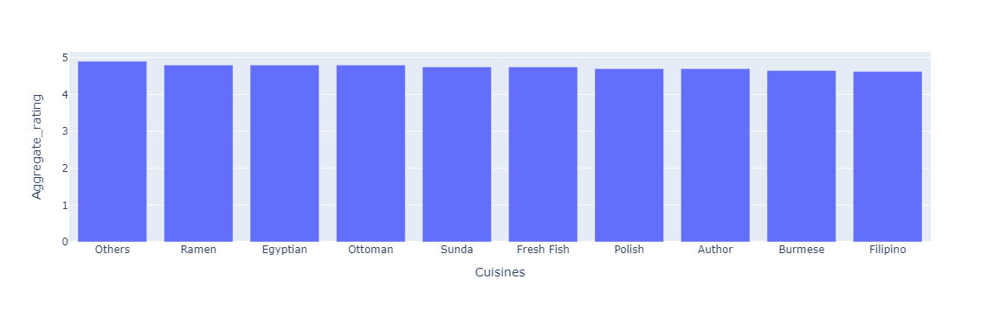

In [193]:
#df1.loc[:, ['Cuisines', 'Aggregate_rating']].groupby('Cuisines').mean().sort_values('Aggregate_rating', ascending=False)

df_aux = df1.loc[:, ['Cuisines', 'Aggregate_rating']].groupby('Cuisines').mean().reset_index()
df_aux = df_aux.sort_values('Aggregate_rating', ascending=False).iloc[0:10, :]

# gráfico
fig = px.bar(df_aux, x='Cuisines', y='Aggregate_rating')
fig.show()

## 13. Qual o tipo de culinária que possui mais restaurantes que aceitam pedidos online e fazem entregas?

In [192]:
df1.loc[(df1.loc[:, 'Is_delivering_now']==1) & (df1.loc[:, 'Has_online_delivery']==1 ), ['Cuisines', 'Is_delivering_now',  'Has_online_delivery']].groupby('Cuisines').count().sort_values(['Is_delivering_now', 'Has_online_delivery'], ascending=False)

,Is_delivering_now,Has_online_delivery
Cuisines,,
North Indian,343,343
Cafe,142,142
South Indian,84,84
Burger,83,83
Fast Food,76,76
Pizza,64,64
Chinese,52,52
Continental,40,40
Italian,40,40
